# Prerequisites

To run this notebook


In [27]:
train = False
datasets_dir = "/home/florent/personnel/data/"

# imports and function definitions

In [42]:
%matplotlib notebook
import os
import csv
import pickle
from collections import Counter
from datetime import datetime

import numpy as np
from matplotlib import pyplot as plt
from sklearn.model_selection import StratifiedShuffleSplit

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.contrib.layers import group_norm
from tensorflow.math import reduce_max

from microfaune.audio import wav2spc

In [66]:
def load_dataset(data_path, use_dump=True):
    mel_dump_file = os.path.join(data_path, "mel_dataset.pkl")
    if os.path.exists(mel_dump_file) and use_dump:
        with open(mel_dump_file, "rb") as f:
            dataset = pickle.load(f)
    else:
        dataset = compute_feature(data_path)
        with open(mel_dump_file, "wb") as f:
            pickle.dump(dataset, f)
    inds = [i for i, x in enumerate(dataset["X"]) if x.shape[1] == 431]
    X = np.array([dataset["X"][i].transpose() for i in inds])
    Y = np.array([int(dataset["Y"][i]) for i in inds])
    uids = [dataset["uids"][i] for i in inds]
    return X, Y, uids

def compute_feature(data_path):
    print(f"Compute features for dataset {os.path.basename(data_path)}")
    labels_file = os.path.join(data_path, "labels.csv")
    if os.path.exists(labels_file):
        with open(labels_file, "r") as f:
            reader = csv.reader(f, delimiter=',')
            labels = {}
            next(reader)  # pass fields names
            for name, y in reader:
                labels[name] = y
    else:
        print("Warning: no label file detected.")
        wav_files = glob(os.path.join(data_path, "wav/*.wav"))
        labels = {os.path.basename(f)[:-4]: None for f in wav_files}
    i = 1
    X = []
    Y = []
    uids = []
    for file_id, y in labels.items():
        print(f"{i:04d}/{len(labels)}: {file_id:20s}", end="\r")
        spc = wav2spc(os.path.join(data_path, "wav", f"{file_id}.wav"))
        X.append(spc)
        Y.append(y)
        uids.append(file_id)
        i += 1
    return {"uids": uids, "X": X, "Y": Y}

In [67]:
def split_dataset(X, Y, random_state=0):
    split_generator = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=random_state)
    ind_train, ind_test = next(split_generator.split(X, Y))
    X_train, X_test = X[ind_train, :, :], X[ind_test, :, :]
    Y_train, Y_test = Y[ind_train], Y[ind_test]
    return ind_train, ind_test

# Load dataset

In [68]:
X0, Y0, uids0 = load_dataset(os.path.join(datasets_dir, "ff1010bird_wav"), use_dump=False)
X1, Y1, uids1 = load_dataset(os.path.join(datasets_dir, "warblrb10k_public_wav"), use_dump=False)
X = np.concatenate([X0, X1]).astype(np.float32)/255
Y = np.concatenate([Y0, Y1])
uids = np.concatenate([uids0, uids1])

Compute features for dataset ff1010bird_wav
Compute features for dataset warblrb10k_public_wav


In [69]:
del X0, X1, Y0, Y1

In [70]:
Counter(Y)

Counter({0: 7664, 1: 7909})

In [71]:
ind_train, ind_test = split_dataset(X, Y)

X_train, X_test = X[ind_train, :, :, np.newaxis], X[ind_test, :, :, np.newaxis]
Y_train, Y_test = Y[ind_train], Y[ind_test]
uids_train, uids_test = uids[ind_train], uids[ind_test]
del X, Y

In [72]:
print("Training set: ", Counter(Y_train))
print("Test set: ", Counter(Y_test))

Training set:  Counter({1: 6327, 0: 6131})
Test set:  Counter({1: 1582, 0: 1533})


# Create model 

In [73]:
n_filter = 64
conv_reg = keras.regularizers.l2(1e-3)
norm = "batch"

spec = layers.Input(shape=[*X_train.shape[1:]], dtype=np.float32)

x = layers.Conv2D(n_filter, (3, 3), padding="same", kernel_regularizer=conv_reg, activation=None)(spec)
if norm == "batch":
    x = layers.BatchNormalization(momentum=0.95)(x)
elif norm == "group":
    x = group_norm(x, groups=4, channels_axis=-1, reduction_axes=[-3, -2])
x = layers.ReLU()(x)
x = layers.Conv2D(n_filter, (3, 3), padding="same", kernel_regularizer=conv_reg, activation=None)(x)
if norm == "batch":
    x = layers.BatchNormalization(momentum=0.95)(x)
elif norm == "group":
    x = group_norm(x, groups=4, channels_axis=-1, reduction_axes=[-3, -2])
x = layers.ReLU()(x)
x = layers.MaxPool2D((1, 2))(x)

x = layers.Conv2D(1.5*n_filter, (3, 3), padding="same", kernel_regularizer=conv_reg, activation=None)(x)
if norm == "batch":
    x = layers.BatchNormalization(momentum=0.95)(x)
elif norm == "group":
    x = group_norm(x, groups=4, channels_axis=-1, reduction_axes=[-3, -2])
x = layers.ReLU()(x)
x = layers.Conv2D(1.5*n_filter, (3, 3), padding="same", kernel_regularizer=conv_reg, activation=None)(x)
if norm == "batch":
    x = layers.BatchNormalization(momentum=0.95)(x)
elif norm == "group":
    x = group_norm(x, groups=4, channels_axis=-1, reduction_axes=[-3, -2])
x = layers.ReLU()(x)
x = layers.MaxPool2D((1, 2))(x)

x = layers.Conv2D(2*n_filter, (3, 3), padding="same", kernel_regularizer=conv_reg, activation=None)(x)
if norm == "batch":
    x = layers.BatchNormalization(momentum=0.95)(x)
elif norm == "group":
    x = group_norm(x, groups=4, channels_axis=-1, reduction_axes=[-3, -2])
x = layers.ReLU()(x)
x = layers.Conv2D(2*n_filter, (3, 3), padding="same", kernel_regularizer=conv_reg, activation=None)(x)
if norm == "batch":
    x = layers.BatchNormalization(momentum=0.95)(x)
elif norm == "group":
    x = group_norm(x, groups=4, channels_axis=-1, reduction_axes=[-3, -2])
x = layers.ReLU()(x)
x = layers.MaxPool2D((1, 2))(x)

x = reduce_max(x, axis=-2)

x = layers.Bidirectional(layers.GRU(64, return_sequences=True))(x)
x = layers.Bidirectional(layers.GRU(64, return_sequences=True))(x)

x = layers.TimeDistributed(layers.Dense(64, activation="sigmoid"))(x)
local_pred = layers.TimeDistributed(layers.Dense(1, activation="sigmoid"))(x)
pred = reduce_max(local_pred, axis=-2)

model = keras.Model(inputs=spec, outputs=pred)
model.summary()

# for predictions only
dual_model = keras.Model(inputs=spec, outputs=[pred, local_pred])

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 431, 40, 1)]      0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 431, 40, 64)       640       
_________________________________________________________________
batch_normalization_12 (Batc (None, 431, 40, 64)       256       
_________________________________________________________________
re_lu_12 (ReLU)              (None, 431, 40, 64)       0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 431, 40, 64)       36928     
_________________________________________________________________
batch_normalization_13 (Batc (None, 431, 40, 64)       256       
_________________________________________________________________
re_lu_13 (ReLU)              (None, 431, 40, 64)       0   

In [74]:
class DataGenerator(keras.utils.Sequence):
    def __init__(self, X, Y, batch_size=32):
        self.X = X
        self.Y = Y
        self.n = len(Y)
        self.batch_size = batch_size
        self.shuffle()
        
    def __len__(self):
        return int(np.floor(self.n)/self.batch_size)
    
    def __getitem__(self, index):
        batch_inds = self.inds[self.batch_size*index:self.batch_size*(index+1)]
        self.counter += self.batch_size
        if self.counter >= self.n:
            self.shuffle()
        return self.X[batch_inds, ...], self.Y[batch_inds]
    
    def shuffle(self):
        self.inds = np.random.permutation(self.n)
        self.counter = 0

In [75]:
if train:
    optimizer = keras.optimizers.Adam(lr=0.001)
    model.compile(optimizer=optimizer,
                  loss='binary_crossentropy',
                  metrics=['accuracy', keras.metrics.FalseNegatives()])

    alpha = 0.5
    batch_size = 32

    data_generator = DataGenerator(X_train, Y_train, batch_size)
    reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                                  patience=5, min_lr=1e-5)

    history = model.fit_generator(data_generator, steps_per_epoch=100, epochs=100,
                                  validation_data=(X_test, Y_test),
                                  class_weight={0: alpha, 1: 1-alpha},
                                  callbacks=[reduce_lr], verbose=1)

    date_str = datetime.now().strftime("%Y%m%d_%H%M%S")
    model.save_weights(f"model_weights-{date_str}.h5")

In [76]:
if train:
    plt.figure(figsize=(9, 6))
    plt.title("Loss")
    plt.plot(history.history["loss"])
    plt.plot(history.history["val_loss"])
    
    plt.figure(figsize=(9, 6))
    plt.title("Accuracy")
    plt.plot(history.history["acc"])
    plt.plot(history.history["val_acc"])

# Results

## Load model

In [77]:
import IPython.display as ipd
from glob import glob

from sklearn.metrics import roc_curve, auc

from microfaune.audio import load_wav
import librosa.display

In [78]:
if not train:
    model.load_weights("model_weights-20190919_220113.h5")

In [79]:
wav_files = {os.path.basename(f)[:-4]: f for f in glob(os.path.join(datasets_dir, "*/wav/*.wav"))}

## Evaluation on validation dataset

In [80]:
%%time
scores, local_scores = dual_model.predict(X_test)

CPU times: user 2min 38s, sys: 25.8 s, total: 3min 4s
Wall time: 1min


In [81]:
Y_hat = scores.squeeze() > 0.5
print(f"Accuracy: {np.mean(Y_hat == Y_test)*100:.2f}")

Accuracy: 90.18


In [82]:
fpr, tpr, sc = roc_curve(Y_test, scores)
print(f"Area under ROC curve: {auc(fpr, tpr):f}")

Area under ROC curve: 0.955267


<IPython.core.display.Javascript object>


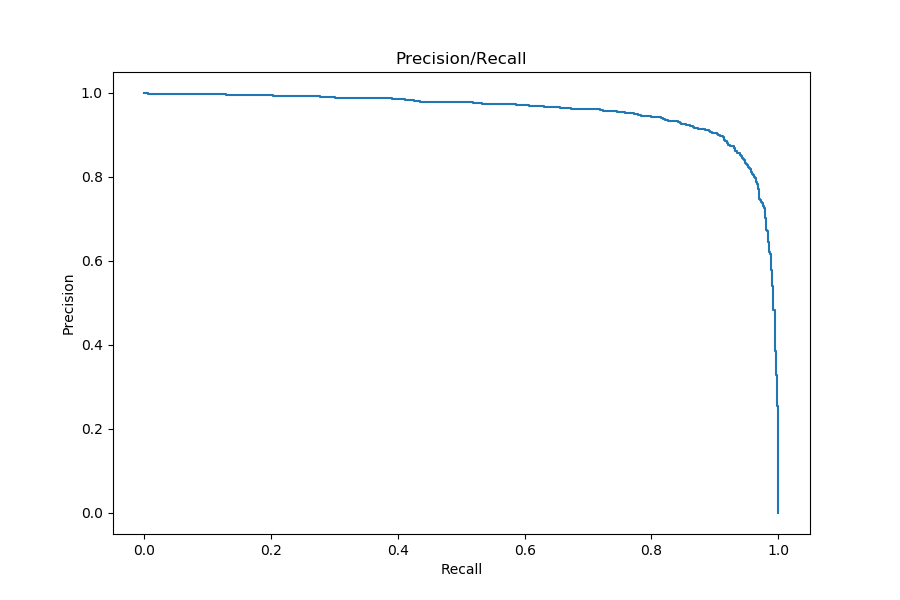

In [84]:
plt.figure(figsize=(9, 6))
plt.plot(1-fpr, tpr)
plt.title("Precision/Recall")
plt.xlabel("Recall")
plt.ylabel("Precision")

plt.savefig("imgs/PR_curve.png")

In [50]:
success = np.where(Y_hat == Y_test)[0]
errors = np.where(Y_hat != Y_test)[0]

In [106]:
def check_result(uid, x, y, pred_score, y_hat_time, wav_files=wav_files):
    wav_file = wav_files[uid]
    sr, audio = load_wav(wav_file)
    plt.figure(figsize=(9, 6))
    label_dict = {0: "Negative", 1: "Positive"}
    plt.suptitle(f"UID: '{uid}', {label_dict[y]} example, predicted score: {pred_score[0]:.2f}")

    plt.subplot(3, 1, 1)
    plt.title("Audio wave")
    librosa.display.waveplot(audio, sr)

    plt.subplot(3, 1, 2)
    plt.title("MEL spectrogram")
    librosa.display.specshow(np.rot90(x.squeeze(), -1))

    plt.subplot(3, 1, 3)
    plt.title("Local prediction")
    ax = plt.gca()
    ax.set_xlim(0, x.shape[0])
    ax.set_ylim(-0.05, 1.05)
    plt.plot(y_hat_time)
    return ipd.Audio(wav_file)
    

## success

<IPython.core.display.Javascript object>


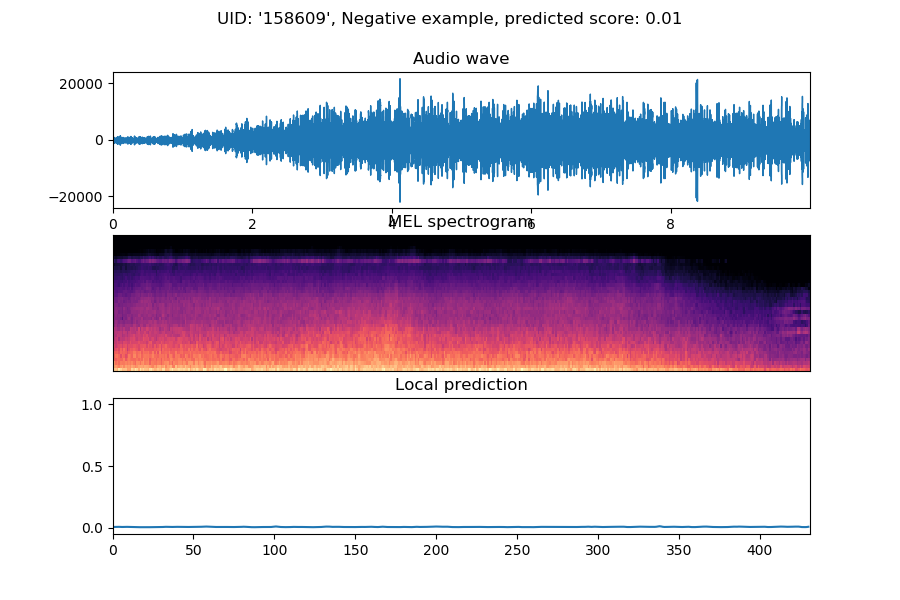

In [88]:
ind = success[10]
check_result(uids_test[ind], X_test[ind], Y_test[ind], scores[ind], local_scores[ind, :])

<IPython.core.display.Javascript object>


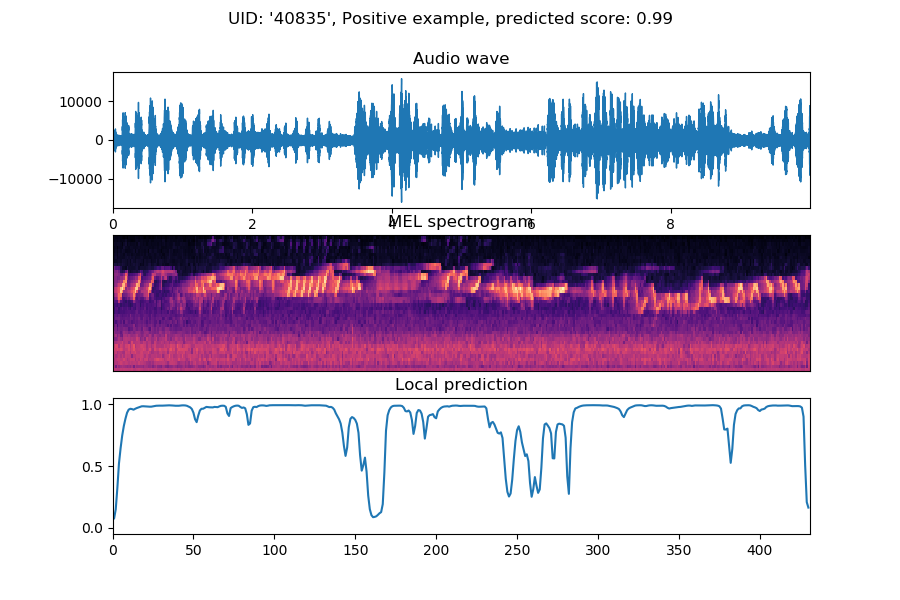

In [101]:
ind = success[26]
reader = check_result(uids_test[ind], X_test[ind], Y_test[ind], scores[ind], local_scores[ind, :])
plt.savefig("imgs/positive_success.png")
reader

<IPython.core.display.Javascript object>


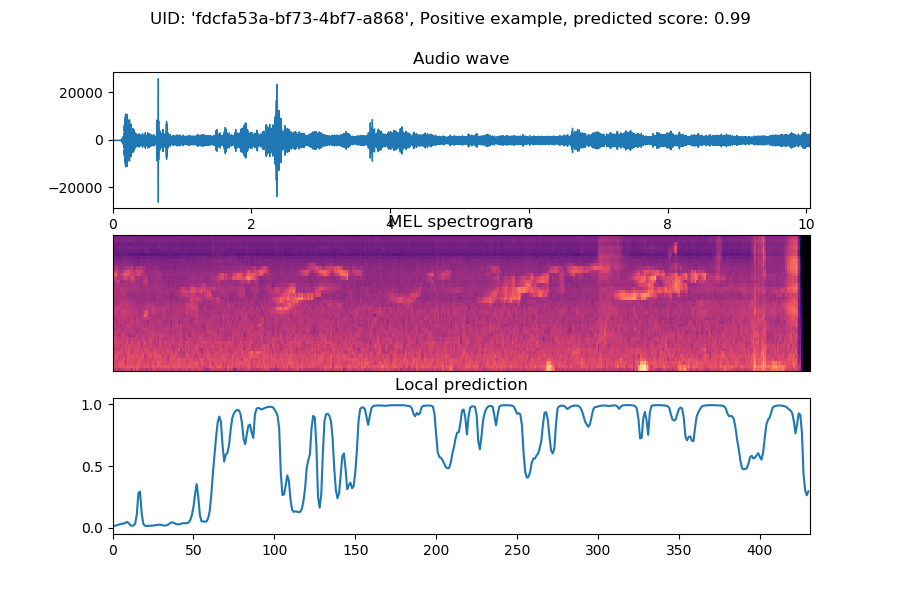

In [89]:
ind = success[15]
check_result(uids_test[ind], X_test[ind], Y_test[ind], scores[ind], local_scores[ind, :])

True label: 1, predicted score: [0.9909748]


<IPython.core.display.Javascript object>


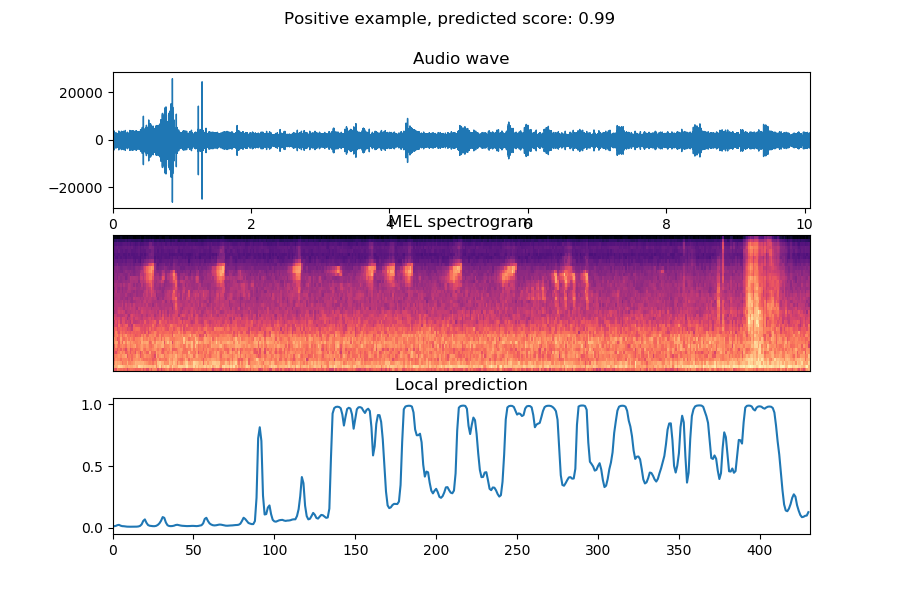

In [72]:
ind = success[99]
check_result(uids_test[ind], X_test[ind], Y_test[ind], scores[ind], local_scores[ind, :])

<IPython.core.display.Javascript object>


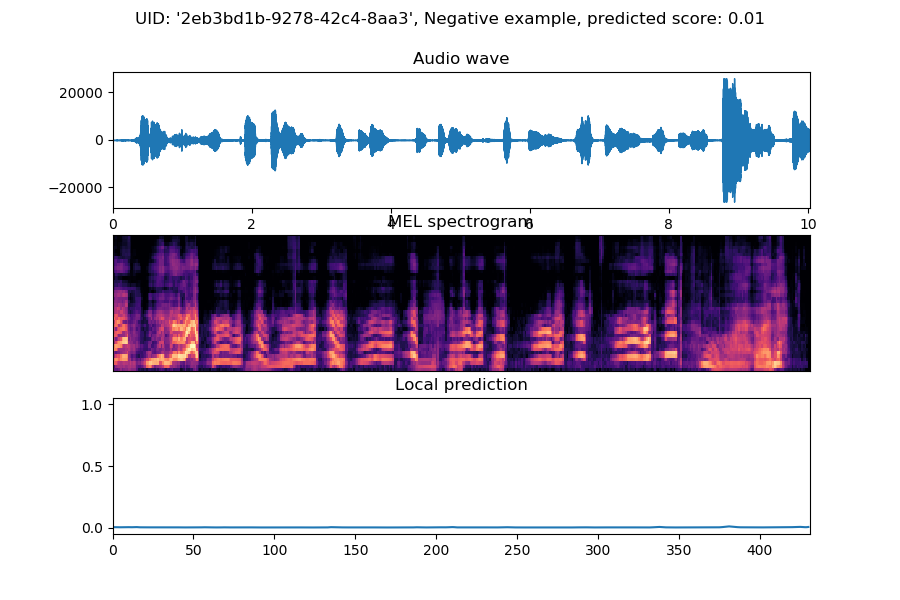

In [90]:
ind = 89
reader = check_result(uids_test[ind], X_test[ind], Y_test[ind], scores[ind], local_scores[ind, :])
plt.savefig("imgs/negative_success.png")
reader

True label: 0, predicted score: [0.01160008]


<IPython.core.display.Javascript object>


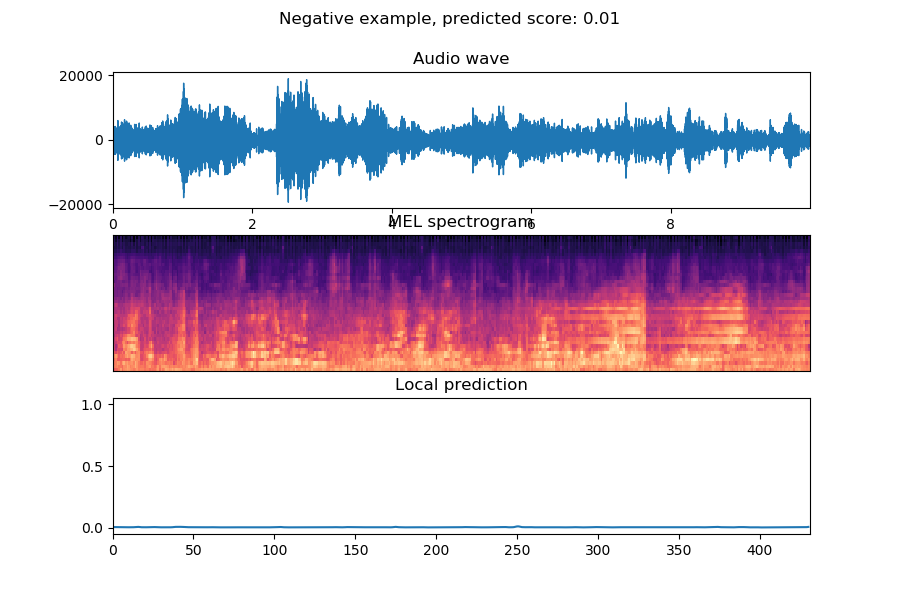

In [77]:
ind = 565
check_result(uids_test[ind], X_test[ind], Y_test[ind], scores[ind], local_scores[ind, :])

## errors

<IPython.core.display.Javascript object>


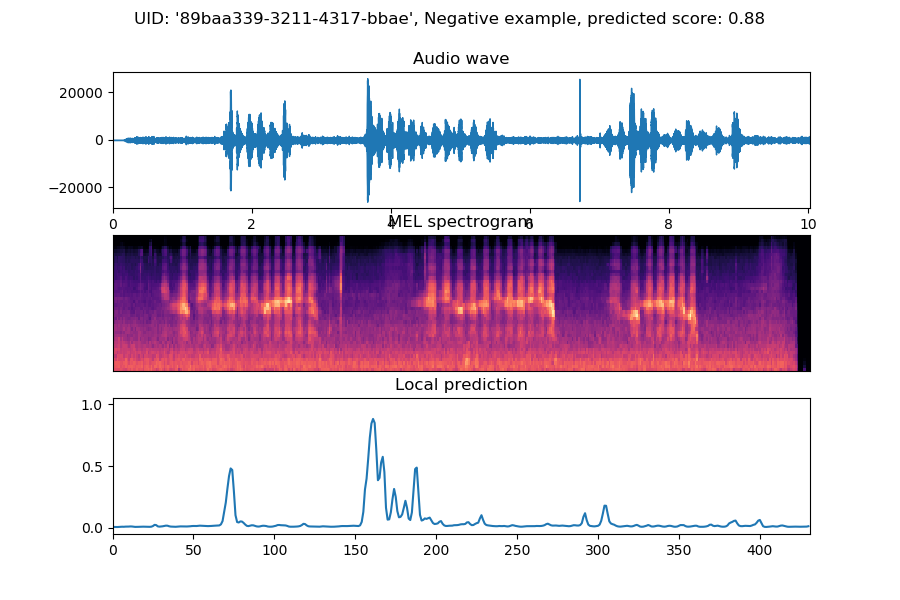

In [93]:
ind = errors[1]
reader = check_result(uids_test[ind], X_test[ind], Y_test[ind], scores[ind], local_scores[ind, :])
plt.savefig("imgs/negative_error.png")
reader

<IPython.core.display.Javascript object>


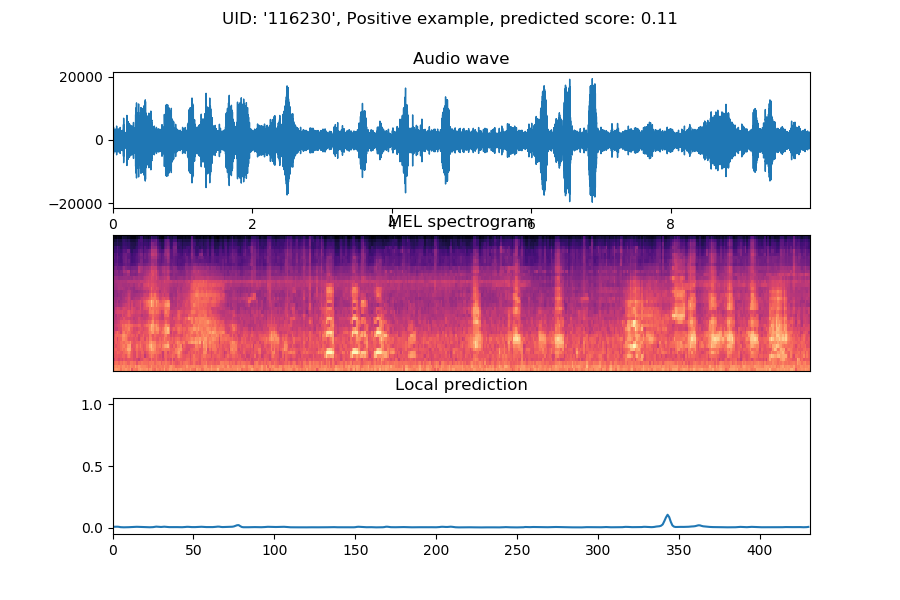

In [95]:
ind = errors[5]
reader = check_result(uids_test[ind], X_test[ind], Y_test[ind], scores[ind], local_scores[ind, :])
plt.savefig("imgs/positive_error.png")
reader

## labelling errors?

<IPython.core.display.Javascript object>


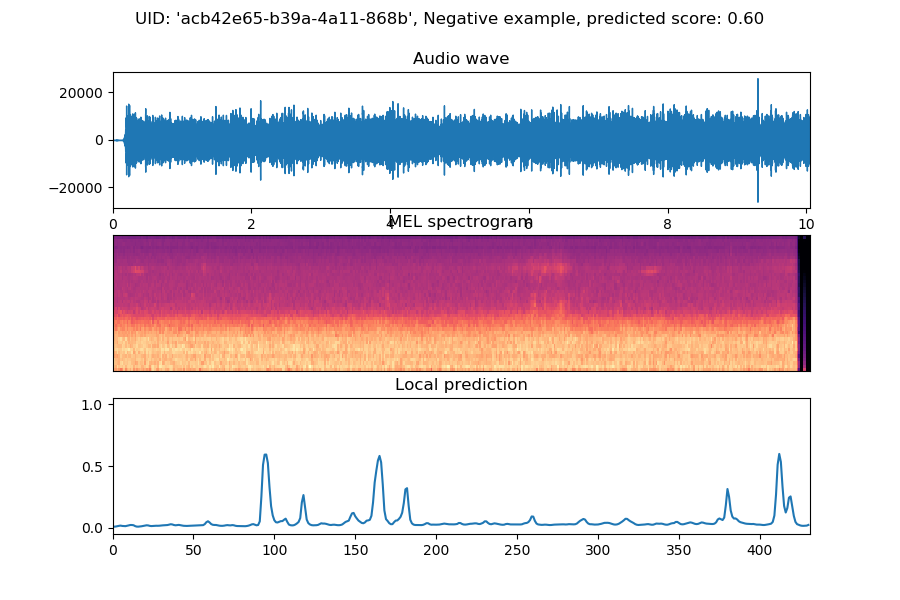

In [98]:
ind = errors[12]
check_result(uids_test[ind], X_test[ind], Y_test[ind], scores[ind], local_scores[ind, :])

<IPython.core.display.Javascript object>


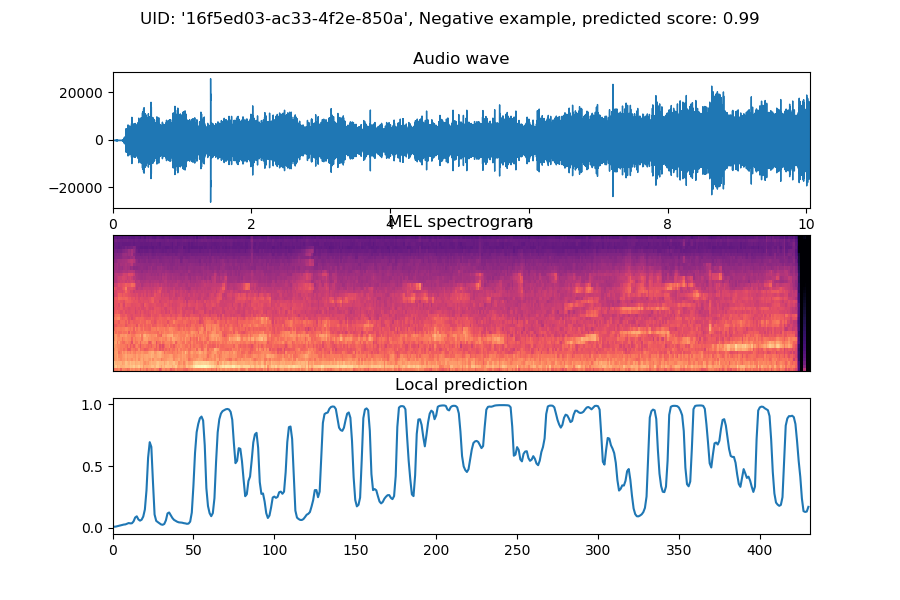

In [99]:
# false error
ind = 105
reader = check_result(uids_test[ind], X_test[ind], Y_test[ind], scores[ind], local_scores[ind, :])
plt.savefig("imgs/labelling_error.png")
reader

## Test on other datasets

### BirdVox

In [101]:
X, Y, uids = load_dataset(os.path.join(datasets_dir, "BirdVox-DCASE-20k"), use_dump=False)
X = X[..., np.newaxis].astype(np.float32)/255

In [115]:
%%time
num_samples = 2500
scores, local_scores = dual_model.predict(X[:num_samples])

CPU times: user 2min 8s, sys: 21.3 s, total: 2min 29s
Wall time: 48.7 s


In [116]:
Y_hat = scores.squeeze() > 0.5
print(f"Accuracy: {np.mean(Y_hat == Y[:num_samples])*100:.2f}")

Accuracy: 58.16


<IPython.core.display.Javascript object>


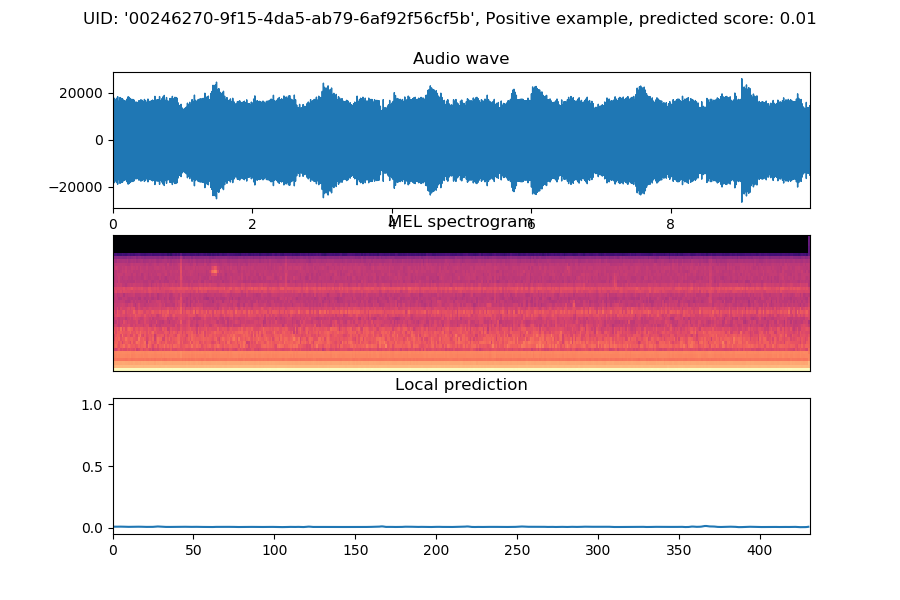

In [118]:
ind = 12
check_result(uids[ind], X[ind], Y[ind], scores[ind], local_scores[ind, :])